In [17]:
from diffusers import StableDiffusionPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
from fastcore.all import concat
from pathlib import Path

model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16).to(
    "cuda"
)
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

/home/pete-00/mambaforge/envs/dreambooth/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
/home/pete-00/mambaforge/envs/dreambooth/lib/python3.10/site-packages/safetensors/torch.py:99: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  with safe_open(filename, framework="pt", device=device) as f:
/home/pete-00/mambaforge/envs/dreambooth/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using 

In [2]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [3]:
prompt = "a gray <krk> cat, in the style of Van Gogh"
torch.manual_seed(515)

100%|██████████| 50/50 [00:05<00:00,  9.28it/s]


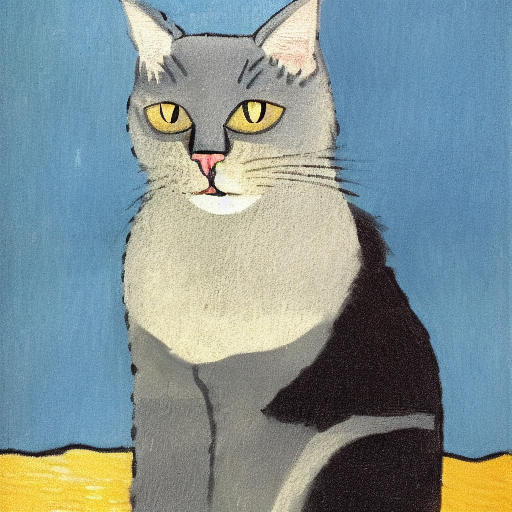

In [4]:
image = pipe(prompt, num_inference_steps=50, guidance_scale=7).images[0]
image

In [ ]:
working_model = "pt/claudio_lorpt/lora_weight.safetensors"

/home/pete-00/mambaforge/envs/dreambooth/lib/python3.10/site-packages/lora_diffusion/lora.py:1011: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  safeloras = safe_open(maybe_unet_path, framework="pt", device="cpu")


<krk>


100%|██████████| 80/80 [00:24<00:00,  3.30it/s]


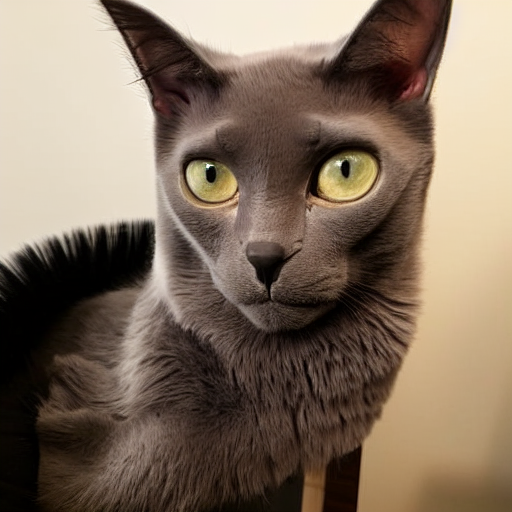

In [5]:
from lora_diffusion import tune_lora_scale, patch_pipe

patch_pipe(
    pipe,
    "pt/claudio_lorpt/lora_weight.safetensors",
    patch_text=True,
    patch_ti=True,
    patch_unet=True,
)

tune_lora_scale(pipe.unet, 1.00)
tune_lora_scale(pipe.text_encoder, 1.00)


images = pipe(prompt, num_images_per_prompt=3, num_inference_steps=80, guidance_scale=9).images[0]
images

In [6]:
tune_lora_scale(pipe.unet, 1.00)
tune_lora_scale(pipe.text_encoder, .3)
images = pipe(prompt, num_images_per_prompt=3, num_inference_steps=80, guidance_scale=9).images

100%|██████████| 80/80 [00:24<00:00,  3.28it/s]


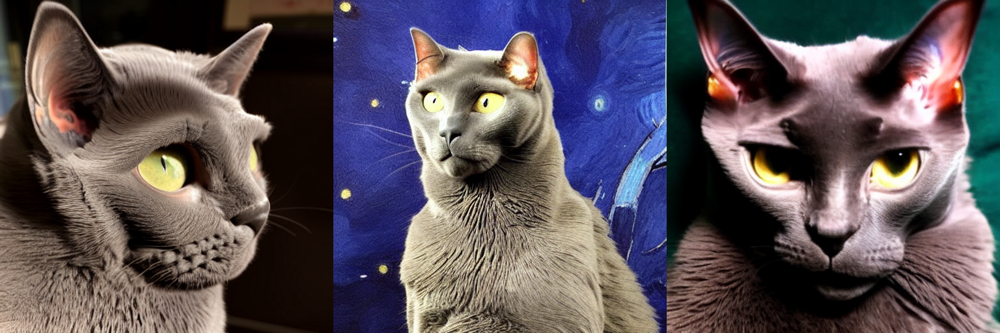

In [7]:
image_grid(images, 1, 3)

In [8]:
# make a list of 9 evenly spaced numbers between 0 and 1 with pytorch
unet_scale = torch.linspace(0, 1, 9).tolist()
text_scale = torch.linspace(0, 1, 9).tolist()

In [9]:
def unet_scale_images(prompt, unet_scale, num_inference_steps=50):
    unet_images = []
    for x in unet_scale:
        tune_lora_scale(pipe.unet, x)
        image = pipe(prompt, num_inference_steps=num_inference_steps).images[0]
        unet_images.append(image)
    return unet_images

In [10]:
def text_scale_images(prompt, text_scale, num_inference_steps=50):
    text_images = []
    for x in text_scale:
        tune_lora_scale(pipe.text_encoder, x)
        image = pipe(prompt, num_inference_steps=num_inference_steps).images[0]
        text_images.append(image)
    return text_images

In [11]:
tune_lora_scale(pipe.unet, 1.00)
tune_lora_scale(pipe.text_encoder, 1.00)

In [12]:
unet_test_imgs = unet_scale_images(prompt, unet_scale, num_inference_steps=70)

100%|██████████| 70/70 [00:08<00:00,  8.20it/s]


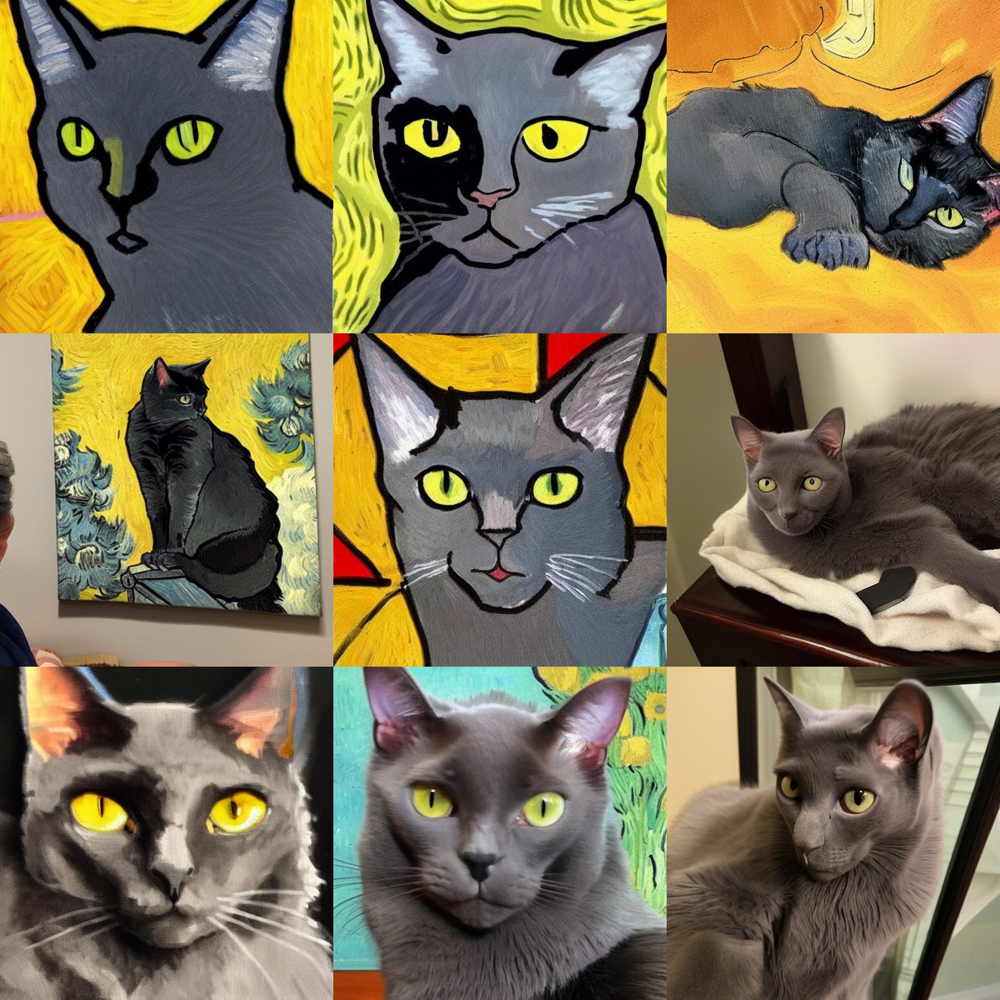

In [13]:
image_grid(unet_test_imgs, 3, 3)

In [14]:
tune_lora_scale(pipe.unet, 1.00)
tune_lora_scale(pipe.text_encoder, 1.00)

In [15]:
text_test_imgs = text_scale_images(prompt, text_scale, num_inference_steps=70)

100%|██████████| 70/70 [00:08<00:00,  8.21it/s]


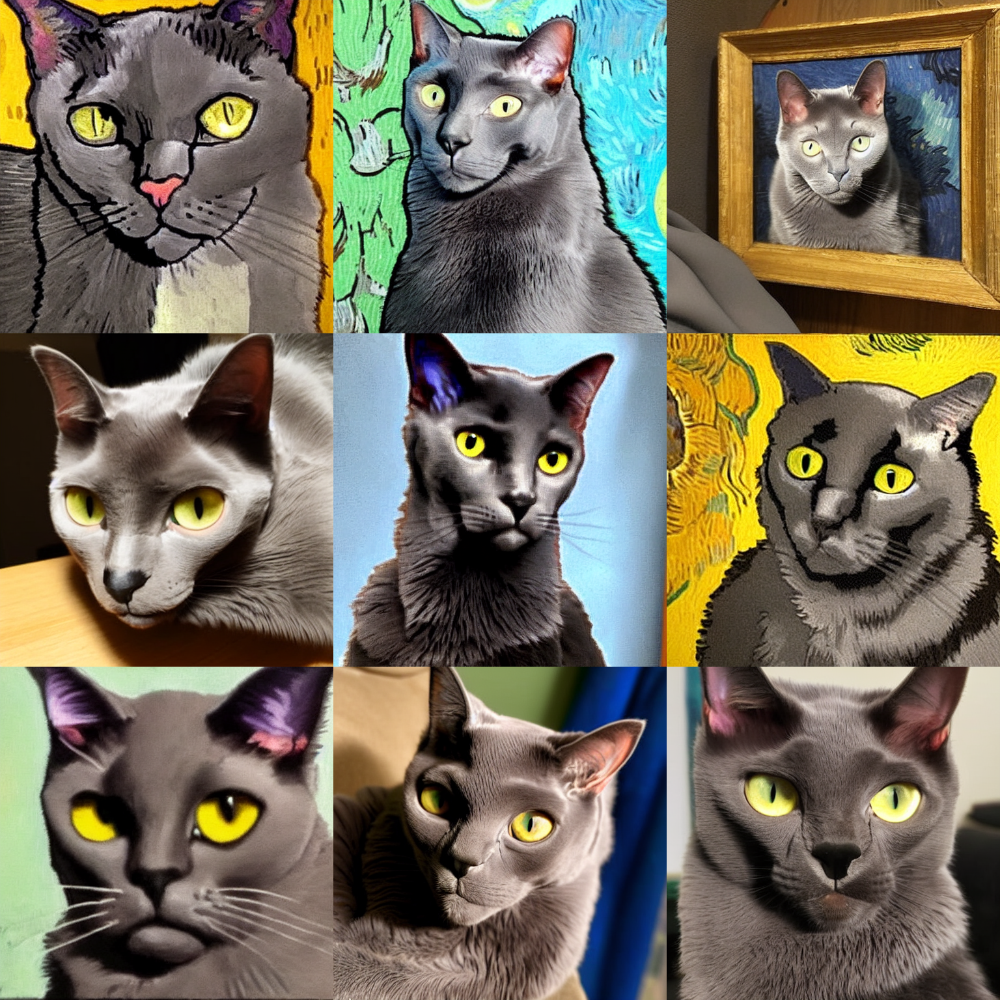

In [16]:
image_grid(text_test_imgs, 3, 3)

inference.ipynb  pt/


In [ ]:
path = Path("img_out").mkdir(exist_ok=True)
for x in images:
        x.save(path/f"_{manual_seed}_{images.index(x)}.png")